In [ ]:
!echo $PATH
import os
os.environ['PATH'] = os.environ['HOME']+'/.local/bin:' + os.environ['PATH']
!echo $PATH

In [ ]:
!python3 --version

In [ ]:
!nvcc --version

In [ ]:
%pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html --user

In [ ]:
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
print(torchvision.__version__)
!gcc --version

In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [4]:
%matplotlib inline
from matplotlib import pyplot as plt
import matplotlib
def show_img(img):
    # Some DPI Scaling ..
    dpi = matplotlib.rcParams['figure.dpi'] / 1.5
    # Determine the figures size in inches to fit your image
    height, width, depth = img.shape
    figsize = width / float(dpi), height / float(dpi)
    plt.figure(figsize=figsize)
    # Some color shifting
    plt.imshow(img[...,::-1]) # RGB-> BGR
    # plt.imshow(img)
    plt.xticks([]), plt.yticks([])
    plt.show()

In [ ]:
!find . | head -10

In [ ]:
im = cv2.imread("./data/ex_01.jpg")
show_img(im)

In [ ]:
cfg = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(im)

In [ ]:
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
show_img(out.get_image()[:, :, ::-1])

In [8]:
from detectron2.structures import BoxMode

def read_json(directory, name):
    json_file = os.path.join(directory, name + ".json") 
    with open(json_file) as f:
        imgs_anns = json.load(f)
    return imgs_anns

classes = list(map(lambda x: x["name"], read_json("data", "train")["categories"]))
print(f"Classes: {classes}")

from detectron2.structures import BoxMode

def get_dicts(directory, name):
    data = read_json(directory, f"{name}")
    dataset_dicts = []
    for image in data["images"]:
        record = {}
        filename = os.path.join(directory, image["file_name"])
        image_id = image["id"]
        height = image["height"]
        width = image["width"]
        record["file_name"] = filename
        record["image_id"] = image_id
        record["height"] = height
        record["width"] = width
        
        annotations = list(filter(lambda a: a["image_id"] == image_id, data["annotations"]))
        for anno in annotations:
            anno["bbox_mode"] = BoxMode.XYXY_ABS
            bbox = anno["bbox"]
            anno["bbox"] = [bbox[0],bbox[1], bbox[0] + bbox[2], bbox[1] + bbox[3]]
        record["annotations"] = annotations
        dataset_dicts.append(record)
    return dataset_dicts


for d in ["train", "val"]:
    DatasetCatalog.register("sketches_" + d, lambda d=d: get_dicts("data", d))
    MetadataCatalog.get("sketches_" + d).set(thing_classes=classes)
sketches_metadata = MetadataCatalog.get("sketches_train")

Classes: ['ClassNode', 'Qualifier', 'NAryAssociationDiamond', 'Package', 'Comment', 'Label', 'Aggregation', 'Composition', 'Extension', 'Dependency', 'Realization', 'CommentConnection', 'AssociationUnidirectional', 'AssociationBidirectional']


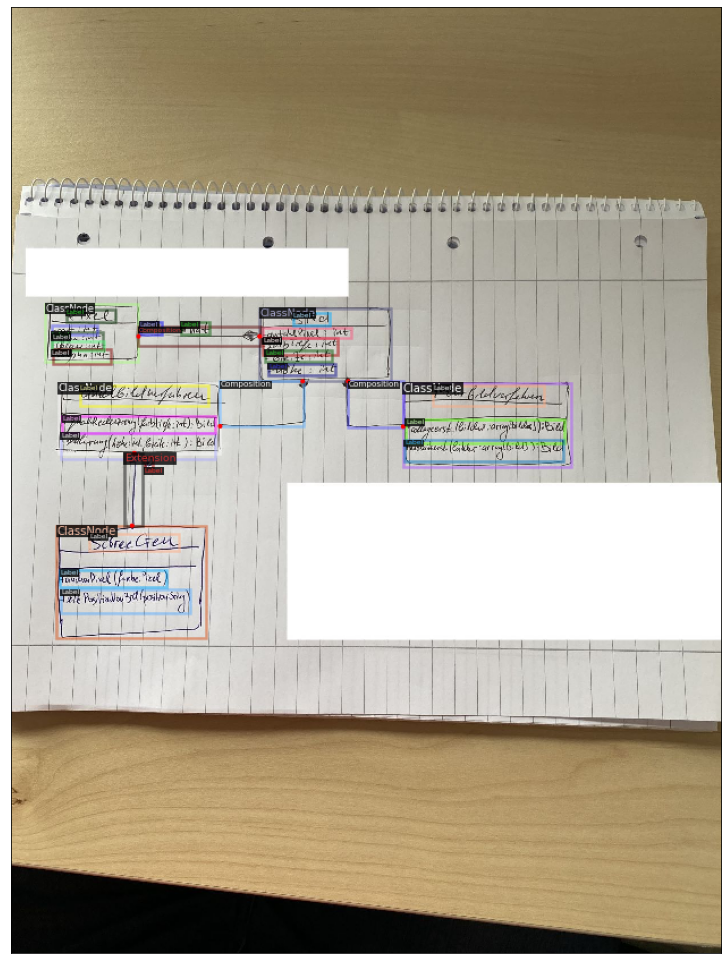

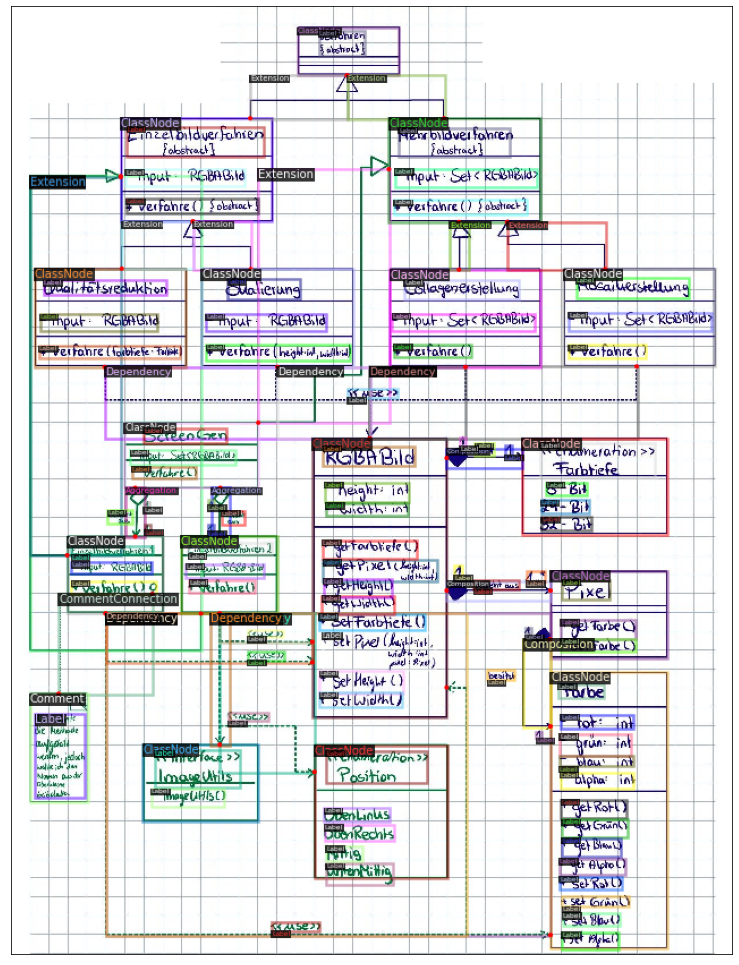

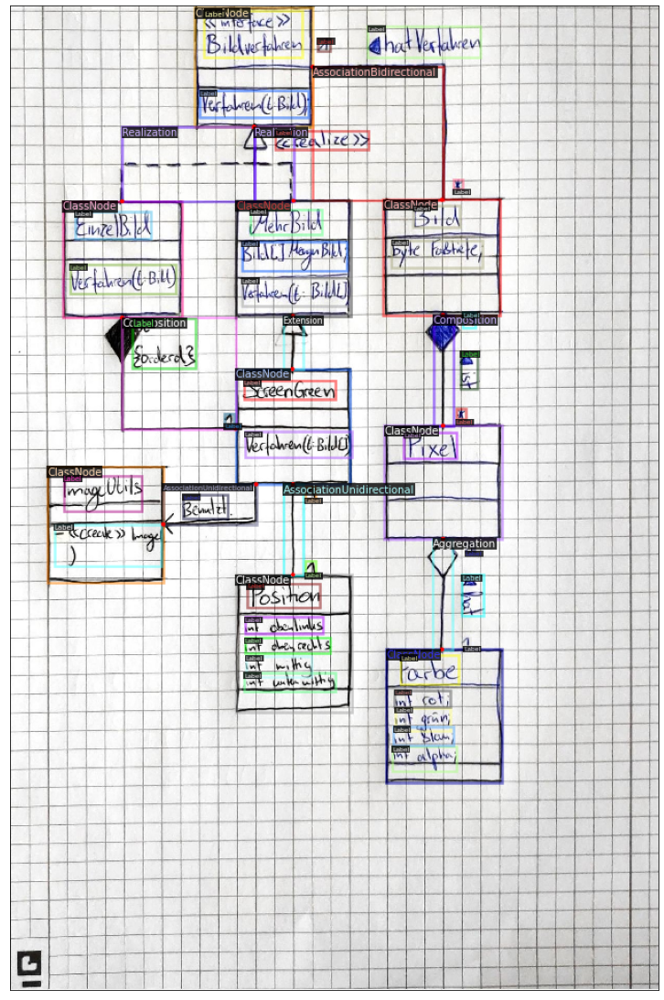

In [9]:
dataset_dicts = get_dicts("data", "train")
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=sketches_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    show_img(out.get_image()[:, :, ::-1])

In [ ]:
from detectron2.engine import DefaultTrainer

# Cope with issue https://github.com/facebookresearch/detectron2/issues/485

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("sketches_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 1000    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(classes)  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

In [21]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.4   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

data/us_15.jpg


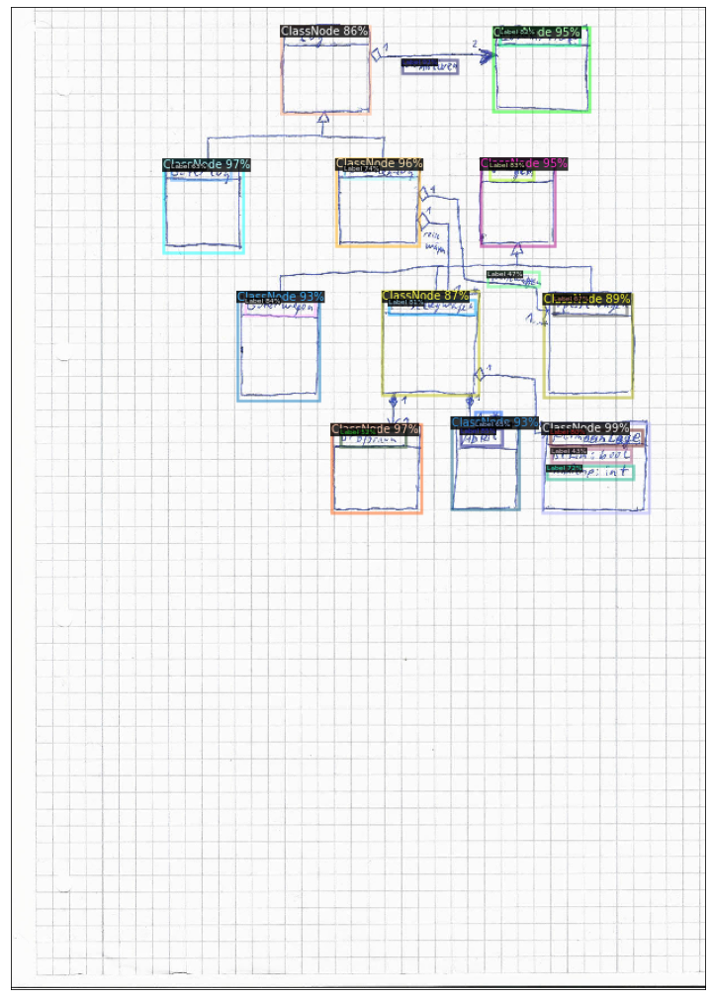

data/ex_60.jpg


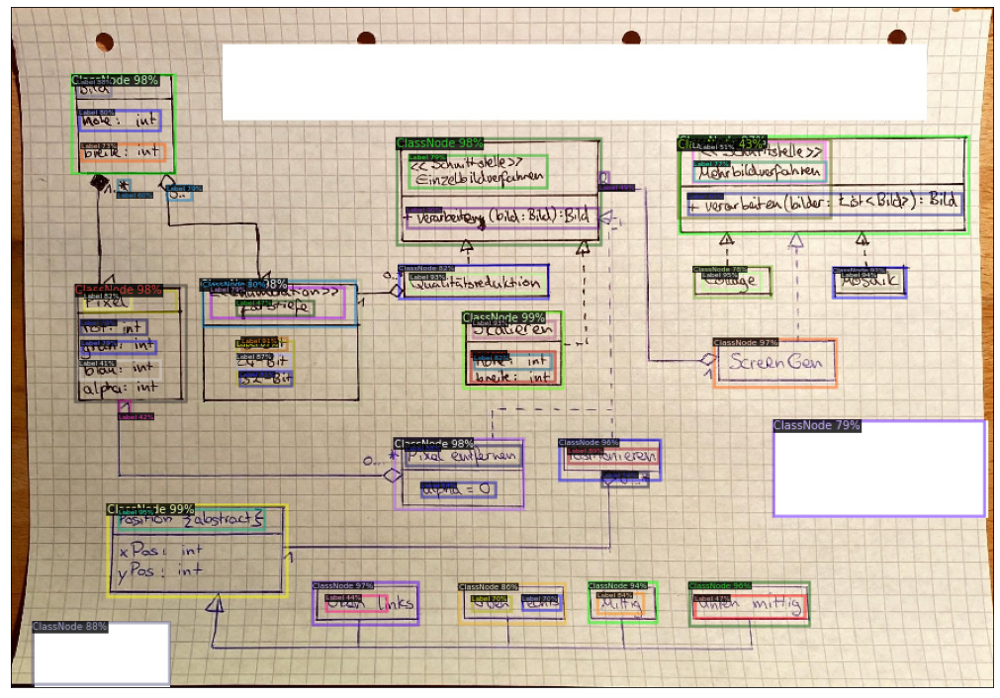

data/us_11.jpg


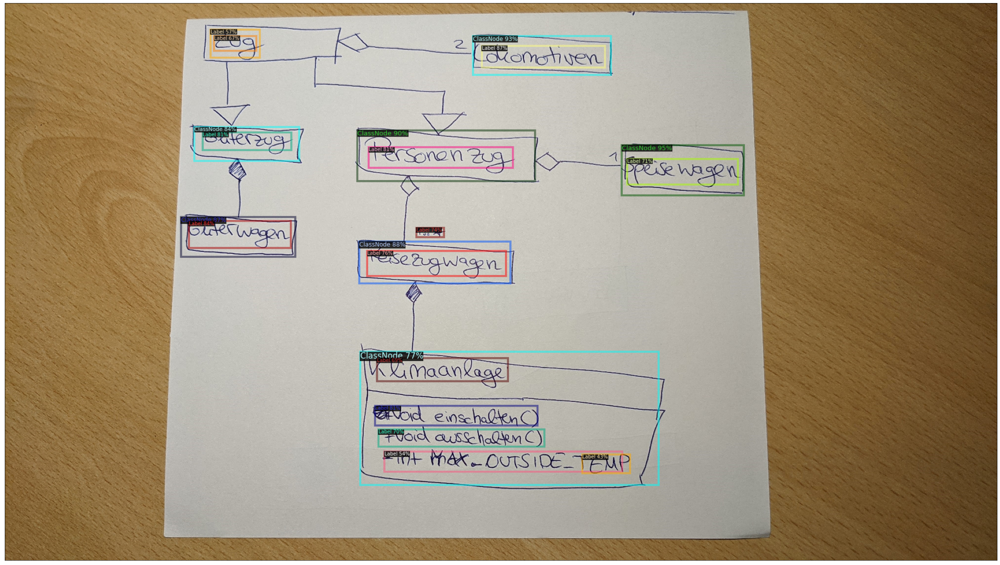

In [23]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_dicts("data", "val")
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    print(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=sketches_metadata, 
                   scale=0.5, 
                   # instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    show_img(out.get_image()[:, :, ::-1])